# (0) Import Library + Dataset

In [1]:
import numpy as np
import pandas as pd

In [2]:
import seaborn as sb
import matplotlib.pyplot as plt
sb.set()
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import altair as alt

In [3]:
customerData = pd.read_csv('dataset/customerData_Clean.csv')
customerData.drop(columns = "Unnamed: 0", inplace = True)
customerData

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,MntGroceryProducts,TotalPurchase,YearRange,TotalChild,HaveChild
0,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,88,...,3,8,10,4,7,806,25,1950,0,0
1,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,1,...,2,1,1,2,5,9,6,1950,2,1
2,1965,Graduation,Married,71613.0,0,0,21-08-2013,26,426,49,...,1,8,2,10,4,287,21,1960,0,0
3,1984,Graduation,Married,26646.0,1,0,10-02-2014,26,11,4,...,2,2,0,4,6,34,8,1980,1,1
4,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,43,...,5,5,3,6,5,207,19,1980,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2200,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,43,...,2,9,3,4,5,267,18,1960,1,1
2201,1946,PhD,Married,64014.0,2,1,10-06-2014,56,406,0,...,7,8,2,5,7,30,22,1940,3,1
2202,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,48,...,1,2,3,13,6,297,19,1980,0,0
2203,1956,Master,Married,69245.0,0,1,24-01-2014,8,428,30,...,2,6,5,10,3,324,23,1950,1,1


In [4]:
colOfNum = []
colOfCat = []
for col in customerData:
    if str(customerData[col].dtypes) != "int64" and str(customerData[col].dtypes) != "float64":
        colOfCat.append(str(col))
    else:
        colOfNum.append(str(col))
        
colOfCat.extend(['Kidhome','Teenhome','NumWebVisitsMonth','YearRange','HaveChild'])

for element in ['Kidhome','Teenhome','NumWebVisitsMonth','YearRange','HaveChild']:
    colOfNum.remove(element)
    
print("Column which consider as Numerical Data:\n", colOfNum)
print()
print("Column which consider as Categorical Data:\n",colOfCat)

Column which consider as Numerical Data:
 ['Year_Birth', 'Income', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'MntGroceryProducts', 'TotalPurchase', 'TotalChild']

Column which consider as Categorical Data:
 ['Education', 'Marital_Status', 'Dt_Customer', 'Kidhome', 'Teenhome', 'NumWebVisitsMonth', 'YearRange', 'HaveChild']


In [5]:
for data in colOfCat:
    customerData[data] = customerData[data].astype("category")

In [6]:
customerData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2205 entries, 0 to 2204
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Year_Birth           2205 non-null   int64   
 1   Education            2205 non-null   category
 2   Marital_Status       2205 non-null   category
 3   Income               2205 non-null   float64 
 4   Kidhome              2205 non-null   category
 5   Teenhome             2205 non-null   category
 6   Dt_Customer          2205 non-null   category
 7   Recency              2205 non-null   int64   
 8   MntWines             2205 non-null   int64   
 9   MntFruits            2205 non-null   int64   
 10  MntMeatProducts      2205 non-null   int64   
 11  MntFishProducts      2205 non-null   int64   
 12  MntSweetProducts     2205 non-null   int64   
 13  MntGoldProds         2205 non-null   int64   
 14  NumDealsPurchases    2205 non-null   int64   
 15  NumWebPurchases      

# (1) Overview

Below is the info of the dataset.

In [6]:
customerData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2205 entries, 0 to 2204
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   Year_Birth           2205 non-null   int64   
 1   Education            2205 non-null   category
 2   Marital_Status       2205 non-null   category
 3   Income               2205 non-null   float64 
 4   Kidhome              2205 non-null   category
 5   Teenhome             2205 non-null   category
 6   Dt_Customer          2205 non-null   category
 7   Recency              2205 non-null   int64   
 8   MntWines             2205 non-null   int64   
 9   MntFruits            2205 non-null   int64   
 10  MntMeatProducts      2205 non-null   int64   
 11  MntFishProducts      2205 non-null   int64   
 12  MntSweetProducts     2205 non-null   int64   
 13  MntGoldProds         2205 non-null   int64   
 14  NumDealsPurchases    2205 non-null   int64   
 15  NumWebPurchases      

# (2) Numerical Value

## 2.0 Overview

In [7]:
customerData[colOfNum].describe()

,Year_Birth,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,MntGroceryProducts,TotalPurchase,TotalChild
count,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000,2205.000000
mean,1968.847166,51361.479592,49.231746,302.803628,26.178685,161.977324,37.173243,26.724263,43.461224,2.328798,4.062132,2.602268,5.807256,225.329252,14.800454,0.958277
std,11.690183,20223.521261,28.903923,335.365930,39.601312,212.559035,54.199662,40.596384,50.966369,1.875022,2.668504,2.726674,3.230630,275.800466,7.583360,0.750729
min,1940.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,1959.000000,35340.000000,24.000000,24.000000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,25.000000,8.000000,0.000000
50%,1970.000000,51132.500000,50.000000,174.000000,8.000000,66.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,90.000000,15.000000,1.000000
75%,1977.000000,67546.000000,74.000000,503.000000,33.000000,226.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,348.000000,21.000000,1.000000
max,1996.000000,94384.000000,99.000000,1493.000000,199.000000,984.000000,259.000000,263.000000,362.000000,15.000000,27.000000,11.000000,13.000000,1306.000000,39.000000,3.000000


<AxesSubplot:>

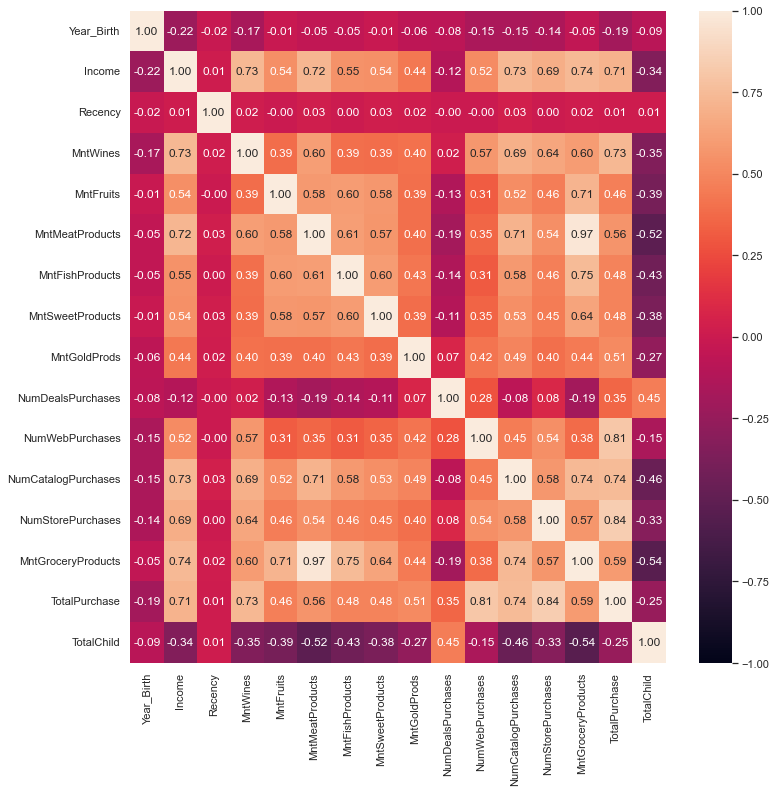

In [8]:
f = plt.figure(figsize=(12,12))
sb.heatmap(customerData[colOfNum].corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

## 2.1 Predictor

In [29]:
customerData["Income"].describe()

count     2205.000000
mean     51361.479592
std      20223.521261
min       1730.000000
25%      35340.000000
50%      51132.500000
75%      67546.000000
max      94384.000000
Name: Income, dtype: float64

In [146]:
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

fig0 = ff.create_distplot([customerData['Income'].values], ['Income'],bin_size = 5000)

fig = make_subplots(rows=2, cols=1,
                    subplot_titles=("Income",""),
                   row_heights=[0.2,0.8],
                   vertical_spacing=0.02)

box0 = go.Box(x = customerData["Income"],legendgroup = "Income",showlegend = False,name = "")
trace0 = go.Histogram(fig0['data'][0],legendgroup = "Income",marker_color='DarkOrchid')
line0 = go.Scatter(fig0['data'][1],legendgroup = "Income",line=dict(color='RebeccaPurple',width=1))

fig.append_trace(box0, 1, 1)
fig.append_trace(trace0, 2, 1)
fig.append_trace(line0, 2, 1)

fig.update_layout(height=500)
fig.show()

In [35]:
customerData["Year_Birth"].describe()

count    2205.000000
mean     1968.847166
std        11.690183
min      1940.000000
25%      1959.000000
50%      1970.000000
75%      1977.000000
max      1996.000000
Name: Year_Birth, dtype: float64

In [34]:
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

fig0 = ff.create_distplot([customerData['Year_Birth'].values], ['Year_Birth'],bin_size = 5)

fig = make_subplots(rows=2, cols=1,
                    subplot_titles=("Year_Birth",""),
                   row_heights=[0.2,0.8],
                   vertical_spacing=0.02)

box0 = go.Box(x = customerData["Year_Birth"],legendgroup = "Year_Birth",showlegend = False,name = "")
trace0 = go.Histogram(fig0['data'][0],legendgroup = "Year_Birth",marker_color='DarkOrchid')
line0 = go.Scatter(fig0['data'][1],legendgroup = "Year_Birth",line=dict(color='RebeccaPurple',width=1))

fig.append_trace(box0, 1, 1)
fig.append_trace(trace0, 2, 1)
fig.append_trace(line0, 2, 1)

fig.update_layout(height=500)
fig.show()

Number of Education: 5
Graduation    1113
PhD            474
Master         365
2n Cycle       199
Basic           54
Name: Education, dtype: int64


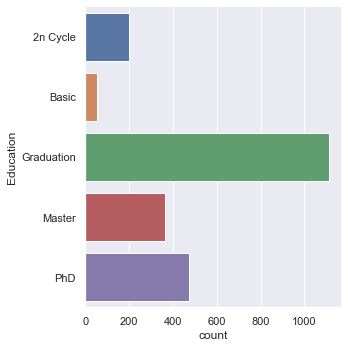

In [31]:
#Cite M2 ExploratoryAnalysis

# Generations in the Dataset
print("Number of Education:", len(customerData["Education"].unique()))

# Pokemons in each Generation
print(customerData["Education"].value_counts())
sb.catplot(y = "Education", data = customerData, kind = "count")

# Response

In [77]:
customerData[['MntWines', 'MntGoldProds', 'MntGroceryProducts', 'TotalPurchase']].describe()

,MntWines,MntGoldProds,MntGroceryProducts,TotalPurchase
count,2205.000000,2205.000000,2205.000000,2205.000000
mean,302.803628,43.461224,225.329252,14.800454
std,335.365930,50.966369,275.800466,7.583360
min,0.000000,0.000000,1.000000,0.000000
25%,24.000000,9.000000,25.000000,8.000000
50%,174.000000,24.000000,90.000000,15.000000
75%,503.000000,56.000000,348.000000,21.000000
max,1493.000000,362.000000,1306.000000,39.000000


In [139]:
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

fig0 = ff.create_distplot([customerData['MntWines'].values], ['MntWines'],bin_size = 200)
fig1 = ff.create_distplot([customerData['MntGoldProds'].values], ['MntGoldProds'],bin_size = 50)
fig2 = ff.create_distplot([customerData['MntGroceryProducts'].values], ['MntGroceryProducts'],bin_size = 200)
fig3 = ff.create_distplot([customerData['TotalPurchase'].values], ['TotalPurchase'],bin_size = 5)

fig = make_subplots(rows=5, cols=2,
                    subplot_titles=("MntWines","MntGoldProds","", "","","",
                                                   "MntGroceryProducts","TotalPurchase","",""),
                   row_heights=[0.09,0.4,0.02,0.09,0.4],
                   vertical_spacing=0.02)

box0 = go.Box(x = customerData["MntWines"],legendgroup = "MntWines",showlegend = False,name = "")
box1 = go.Box(x = customerData["MntGoldProds"],legendgroup = "MntGoldProds",showlegend = False,name = "")
box2 = go.Box(x = customerData["MntGroceryProducts"],legendgroup = "MntGroceryProducts",showlegend = False,name = "")
box3 = go.Box(x = customerData["TotalPurchase"],legendgroup = "TotalPurchase",showlegend = False,name = "")
trace0 = go.Histogram(fig0['data'][0],legendgroup = "MntWines",marker_color='DarkOrchid')
trace1 = go.Histogram(fig1['data'][0],legendgroup = "MntGoldProds",marker_color='DarkOrange')
trace2 = go.Histogram(fig2['data'][0],legendgroup = "MntGroceryProducts",marker_color='LawnGreen')
trace3 = go.Histogram(fig3['data'][0],legendgroup = "TotalPurchase",marker_color='MediumSlateBlue')
line0 = go.Scatter(fig0['data'][1],legendgroup = "MntWines",line=dict(color='RebeccaPurple',width=1))
line1 = go.Scatter(fig1['data'][1],legendgroup = "MntGoldProds",line=dict(color='OrangeRed',width=1))
line2 = go.Scatter(fig2['data'][1],legendgroup = "MntGroceryProducts",line=dict(color='MediumSeaGreen',width=1))
line3 = go.Scatter(fig3['data'][1],legendgroup = "TotalPurchase",line=dict(color='RebeccaPurple',width=1))


fig.append_trace(box0, 1, 1)
fig.append_trace(box1, 1, 2)
fig.append_trace(box2, 4, 1)
fig.append_trace(box3, 4, 2)

fig.append_trace(trace0, 2, 1)
fig.append_trace(trace1, 2, 2)
fig.append_trace(trace2, 5, 1)
fig.append_trace(trace3, 5, 2)

fig.append_trace(line0, 2, 1)
fig.append_trace(line1, 2, 2)
fig.append_trace(line2, 5, 1)
fig.append_trace(line3, 5, 2)


fig.update_layout(height=1300)
fig.show()

# (4) Multi-Variable Visualization

In [ ]:
box1 = go.Box(x = customerData["Education"].loc[:,['Education', 'MntGroceryProducts']].groupby(['Education']).median().sort_values(by = "MntGoldProds"),y = customerData["MntGoldProds"],name = "")
box2 = go.Box(x = customerData["Education"].loc[:,['Education', 'MntGroceryProducts']].groupby(['Education']).median().sort_values(by = "MntGroceryProducts"),y = customerData["MntGroceryProducts"],name = "")
box3 = go.Box(x = customerData["Education"].loc[:,['Education', 'MntGroceryProducts']].groupby(['Education']).median().sort_values(by = "TotalPurchase"),y = customerData["TotalPurchase"],name = "")

fig.append_trace(box1, 1, 2)
fig.append_trace(box2, 2, 1)
fig.append_trace(box3, 2, 2)

box0 = go.Box(x = customerData["Education"], y = customerData["TotalPurchase"],name = "")

fig.append_trace(box0, 1, 1)

fig.update_layout(height=1000,width = 900)
fig.show()

box0 = go.Box(x = customerData["Education"], y = customerData["TotalPurchase"],name = "")

fig.append_trace(box0, 1, 1)

fig.update_layout(height=1000,width = 900)
fig.show()

customerData["Education"].index(grouped.index())

In [126]:
fig = make_subplots(rows=2, cols=2,
                    subplot_titles=("MntWines","MntGoldProds","MntGroceryProducts","TotalPurchase"),
                   vertical_spacing=0.1)


df = customerData.copy()

df2 = pd.DataFrame({df.mean(axis=1).values})

grouped = df.groupby(["Education"])
order = grouped.median()["MntWines"].sort_values().index
order

C:\Users\USER\AppData\Local\Temp/ipykernel_17472/742011977.py:8: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



TypeError: unhashable type: 'numpy.ndarray'

## Multi-variable scatterplot using altair

In [15]:
def interactiveScatterPlot(dataset,x,y,var):
    alt.renderers.enable('default')
    selection = alt.selection_multi(fields=[var], bind='legend')
    chart = alt.Chart(dataset).mark_circle(size=50).encode(
        alt.X(x),
        alt.Y(y),
        alt.Color(var, 
                  legend=alt.Legend(
                      title=var,  
                      orient='left',
                      titleFontSize=15,
                      labelFontSize=13)
                 ),
        opacity=alt.condition(selection, alt.value(1), alt.value(0))
    ).properties(
        height=350, width=500
    ).configure_axis(
        titleFontSize=20,
        labelFontSize=15
    ).add_selection(
        selection
    )
    
    return chart

In [16]:
interactiveScatterPlot(customerData,'Income','TotalPurchase','YearRange')

alt.Chart(...)

In [17]:
interactiveScatterPlot(customerData,'Income','MntWines','YearRange')

alt.Chart(...)

In [18]:
interactiveScatterPlot(customerData,'Income','MntGroceryProducts','YearRange')

alt.Chart(...)

In [25]:
interactiveScatterPlot(customerData,'Income','MntGoldProds','YearRange')

alt.Chart(...)

In [23]:
interactiveScatterPlot(customerData,'Income','TotalPurchase','Education')

alt.Chart(...)

In [22]:
interactiveScatterPlot(customerData,'Income','MntGroceryProducts','Education')

alt.Chart(...)

In [27]:
interactiveScatterPlot(customerData,'Income','MntWines','Education')

alt.Chart(...)

In [28]:
interactiveScatterPlot(customerData,'Income','MntGoldProds','Education')

alt.Chart(...)